# Tool failure modes prediction #

Welcome to this assignment. In this asignment you will try to predict 4 indepent failure modes:
- tool wear failure (TWF)
- heat dissipation failure (HDF)
- power failure (PWF)
- overstrain failure (OSF)<br>

In addition you will try to predict the total failure mode (machine failure).

Please note, due to the confidentiality of these data sets this data set is artificially generated. I will reveal the source after succesful completion of the assignment.

Below I will help you a little bit, but I expect a lot more from you!<br>
The assignments are indicated below with 1), 2) etc.


In [3]:
import pandas as pd
url = 'https://raw.githubusercontent.com/bbozon/DataScience/refs/heads/main/ai4i2020.csv'
'''
The dataset consists of 10 000 data points stored as rows with 14 features in columns
UID: unique identifier ranging from 1 to 10000
product ID: consisting of a letter L, M, or H for low (50% of all products), medium (30%) and high (20%) as product quality variants and a variant-specific serial number
air temperature [K]
process temperature [K]
rotational speed [rpm]
torque [Nm]
tool wear [min]

The machine failure consists of five independent failure modes
tool wear failure (TWF)
heat dissipation failure (HDF)
power failure (PWF)
overstrain failure (OSF)
random failures (RNF)

If at least one of the above failure modes is true, the process fails and the 'machine failure' label is set to 1.
'''
df = pd.read_csv(url)

# change column label "UDI" to "UID"
df

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,M24855,M,298.8,308.4,1604,29.5,14,0,0,0,0,0,0
9996,9997,H39410,H,298.9,308.4,1632,31.8,17,0,0,0,0,0,0
9997,9998,M24857,M,299.0,308.6,1645,33.4,22,0,0,0,0,0,0
9998,9999,H39412,H,299.0,308.7,1408,48.5,25,0,0,0,0,0,0


# First step #


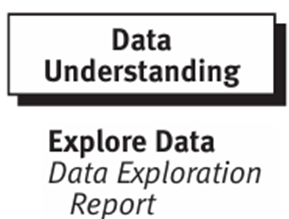


I will help you a little bit. I will combine the columns TWF, HDF, PWF, OSF and RNF in a new column "Combined_failure_modes".

In [4]:
# generated by chat gpt (but I do understand it ;-))
def combine_columns(row):
    for col in ['TWF','HDF','PWF','OSF','RNF']:
        if row[col] == 1:
            return col
    return 'No failure'

# Create a new column with the combined values
df['Combined_failure_modes'] = df.apply(combine_columns, axis=1)
df

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF,Combined_failure_modes
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0,No failure
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0,No failure
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0,No failure
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0,No failure
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0,No failure
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,M24855,M,298.8,308.4,1604,29.5,14,0,0,0,0,0,0,No failure
9996,9997,H39410,H,298.9,308.4,1632,31.8,17,0,0,0,0,0,0,No failure
9997,9998,M24857,M,299.0,308.6,1645,33.4,22,0,0,0,0,0,0,No failure
9998,9999,H39412,H,299.0,308.7,1408,48.5,25,0,0,0,0,0,0,No failure


Again I will help you a little bit. We could try a pairplot, let's make the label "Machine failure".

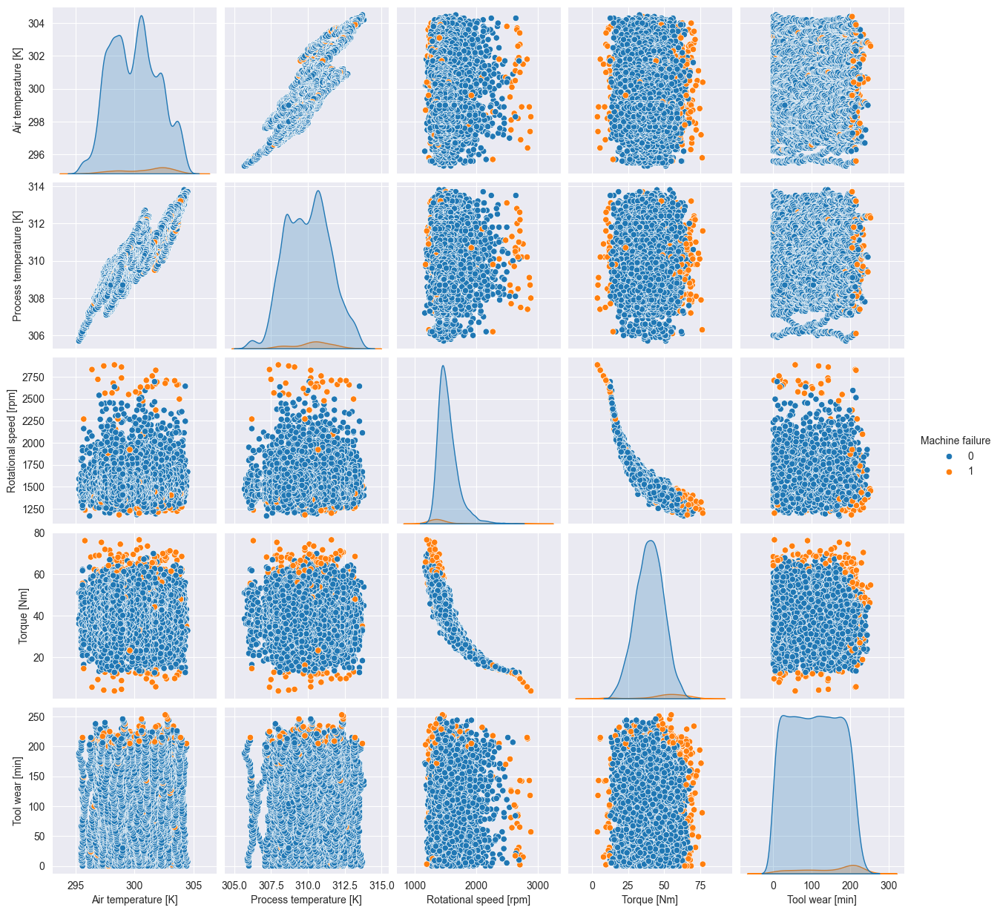

In [3]:
import seaborn as sns

sns.pairplot(df.drop(['UDI','Product ID','Type','TWF','HDF','PWF','OSF','RNF'],axis=1), hue='Machine failure')

1) Try the same pairplot for the other failure modes.

2) Try the pairplot for the 'Combined_failure_modes'.

2) Try different type of plots. Which plot would you use for the tool wear (time)?

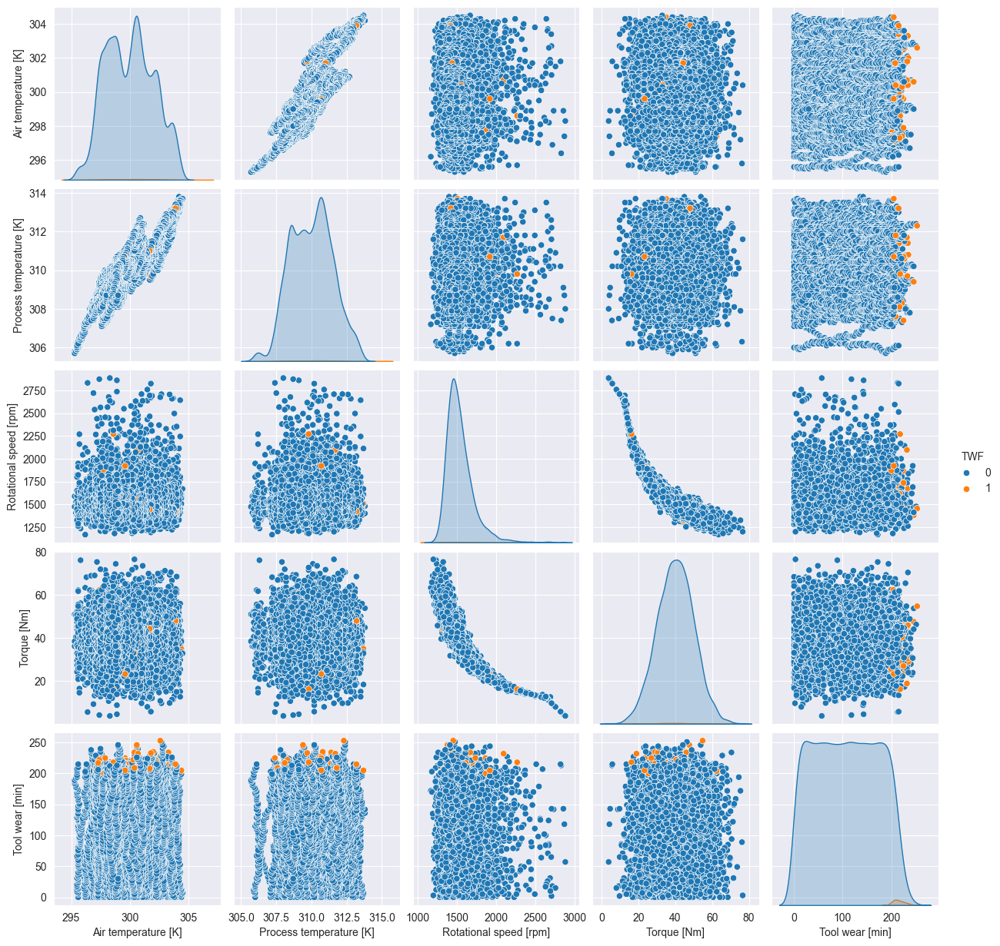

In [4]:
# pairplot with hue on "TWF"
sns.pairplot(df.drop(['UDI','Product ID','Type','HDF','PWF','OSF','RNF', 'Machine failure'],axis=1), hue='TWF')

All tools ware of TWF is at the end of the time period

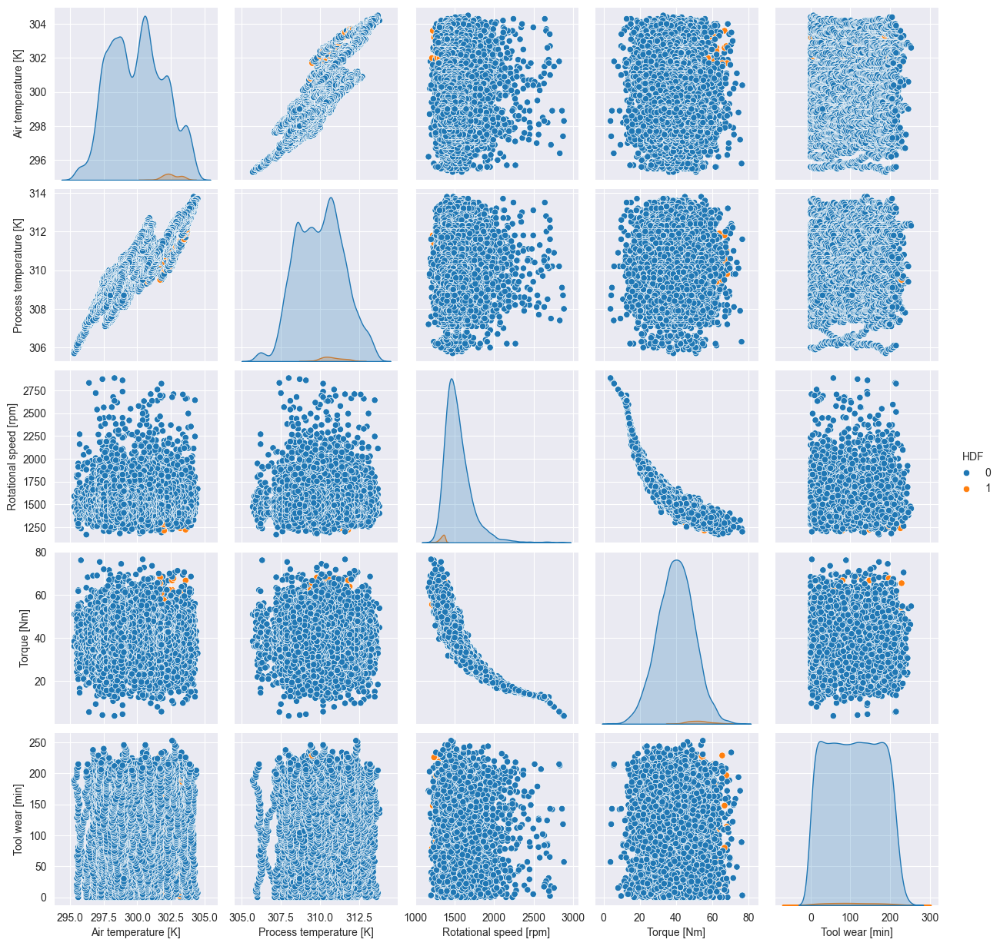

In [5]:
# pairplot with hue on "HDF"
sns.pairplot(df.drop(['UDI','Product ID','Type','TWF','PWF','OSF','RNF', 'Machine failure'],axis=1), hue='HDF')

More overall, but stil at the end of the time

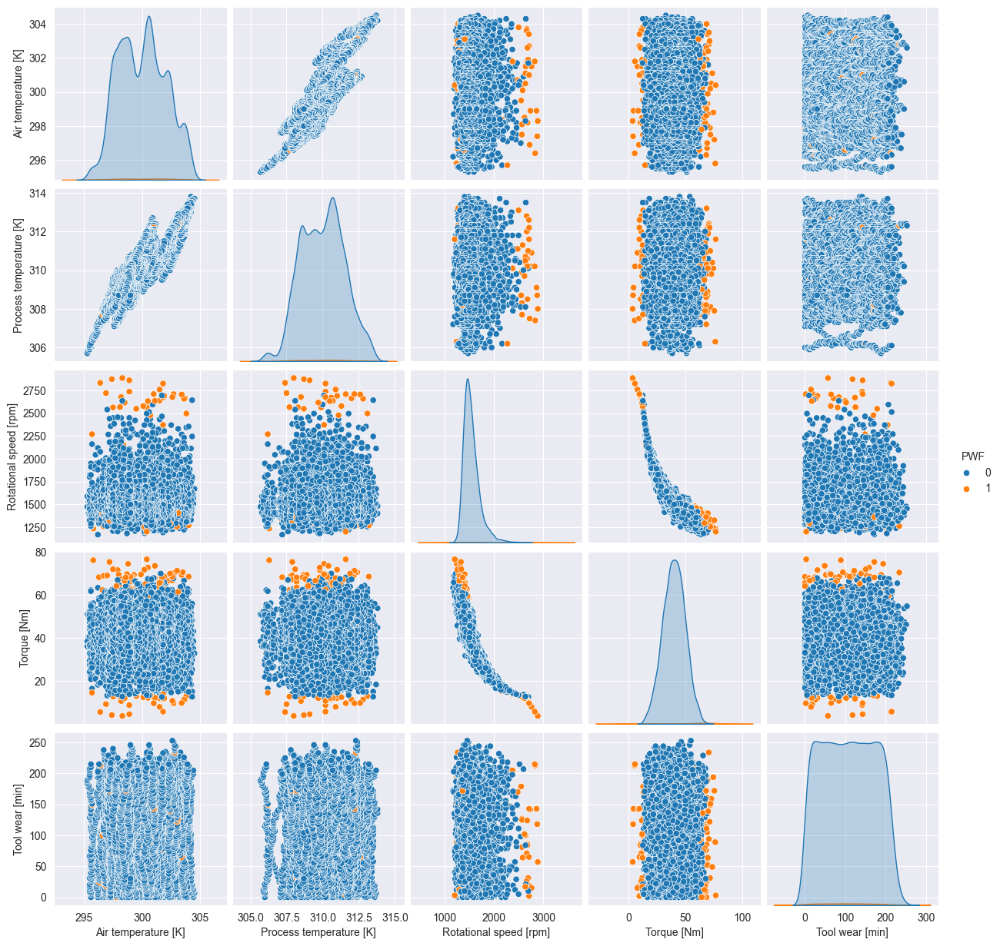

In [6]:
# pairplot with hue on "PWF"
sns.pairplot(df.drop(['UDI','Product ID','Type','TWF','HDF','OSF','RNF', 'Machine failure'],axis=1), hue='PWF')

Less about time, more at the start and end of speed and torque

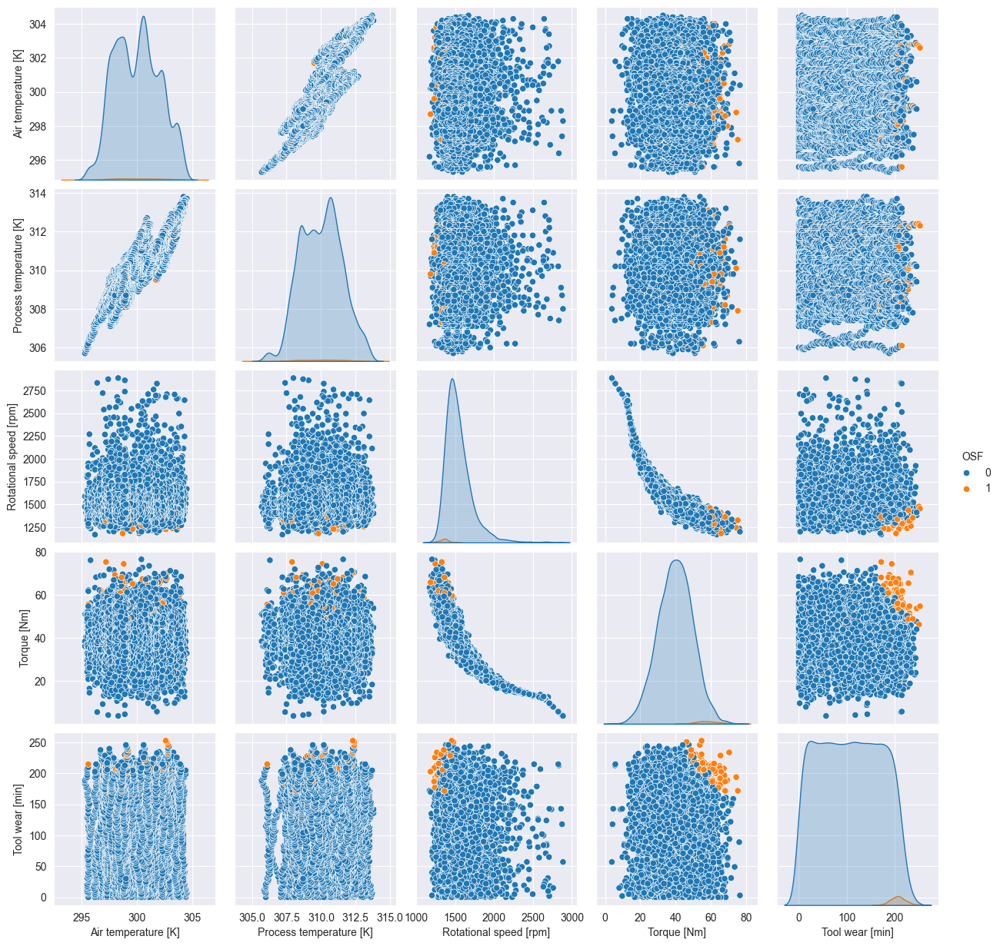

In [7]:
# pairplot with hue on "OSF"
sns.pairplot(df.drop(['UDI','Product ID','Type','TWF','HDF','PWF','RNF', 'Machine failure'],axis=1), hue='OSF')

More random

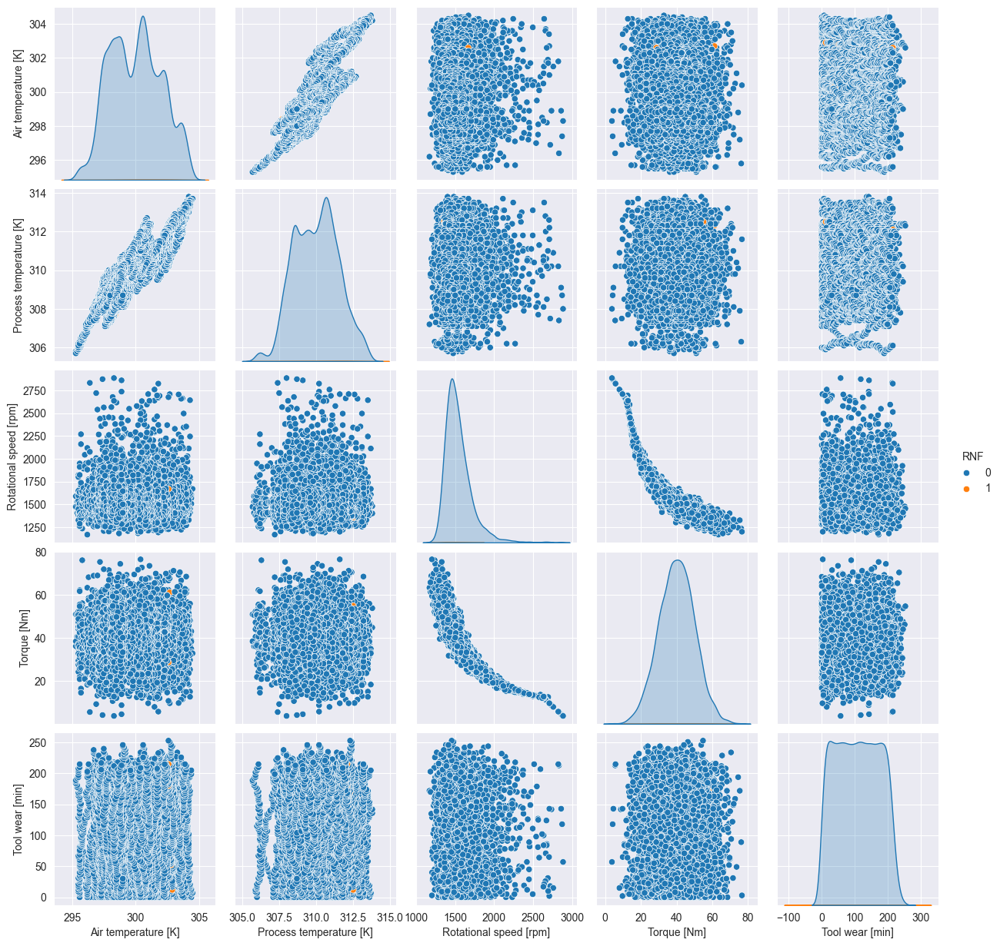

In [8]:
# pairplot with hue on "RNF"
sns.pairplot(df.drop(['UDI','Product ID','Type','TWF','HDF','PWF','OSF', 'Machine failure'],axis=1), hue='RNF')

even more random

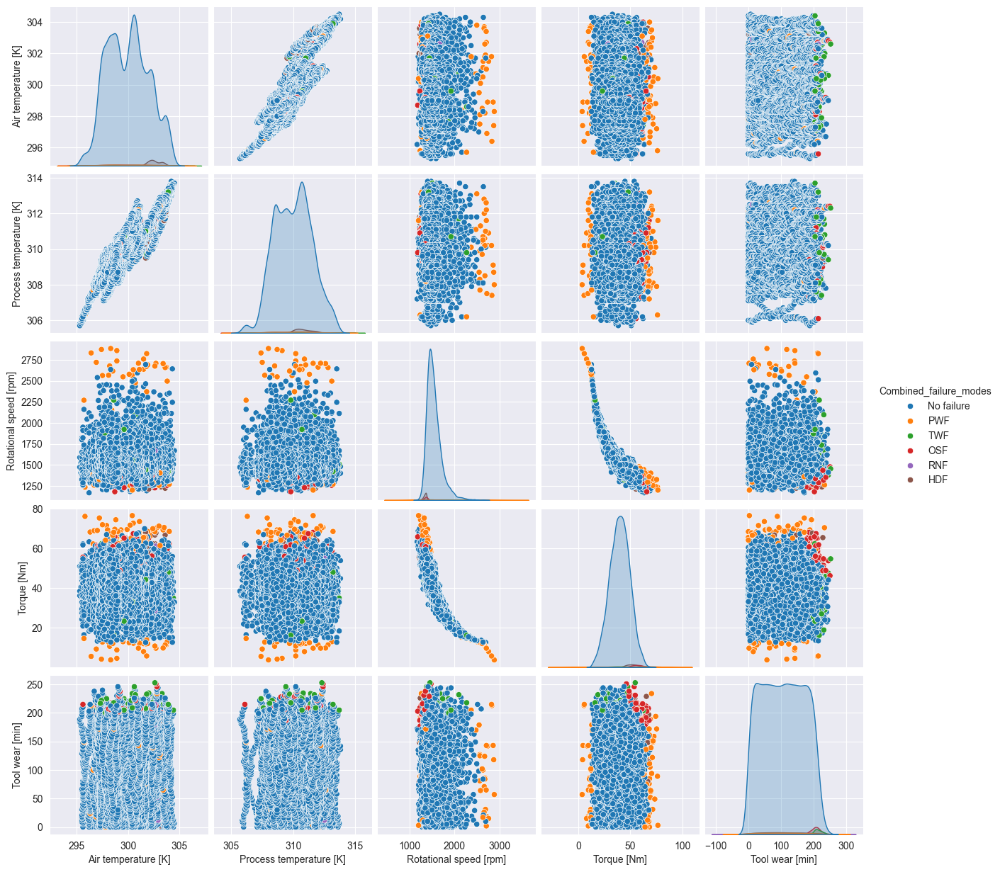

In [9]:
# pairplot combined failure modes
sns.pairplot(df.drop(['UDI','Product ID','Type','TWF','HDF','PWF','OSF', 'RNF' , 'Machine failure'],axis=1), hue='Combined_failure_modes')


# Second step #

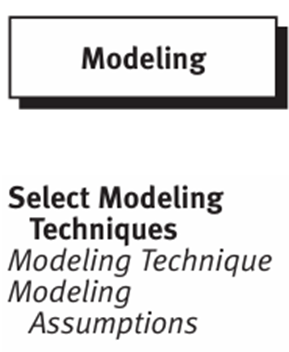

1) What kind of models do you want to try? For which failure mode? <br>
2) Which assumptions can/did you make about the data? And the model?<br>
3) Probably you need different models for different failure modes? What do you think?

1. I'm the failure modes are binary, so I'm going to try random forest classification for starters. For the combined output a classifying type model works best but i dont know wich one.
2. x
3. Yes, because of the randomness and location of the different failure types

# Third step #

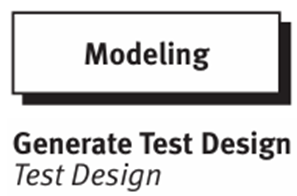

1) Which data are you selecting for which model? <br>
2) Split your dataset in train/validation/test. <br>
3) Any scaling or other preprocessing needed? <br>

In [6]:
# I'm just giving you 1 example....
X=df.drop(['UDI','Product ID','Type','Machine failure','TWF','HDF','PWF','OSF','RNF','Combined_failure_modes'],axis=1) # I'm dropping the colomns I do NOT want.
y=df['Machine failure']

from sklearn.model_selection import train_test_split
# we always want to work with a training, validation and test data set
X_train, X_valid_plus_test, y_train, y_valid_plus_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_test, X_validation, y_test,y_validation = train_test_split(X_valid_plus_test, y_valid_plus_test, test_size=0.5, random_state=42)

In [7]:
X

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min]
0,298.1,308.6,1551,42.8,0
1,298.2,308.7,1408,46.3,3
2,298.1,308.5,1498,49.4,5
3,298.2,308.6,1433,39.5,7
4,298.2,308.7,1408,40.0,9
...,...,...,...,...,...
9995,298.8,308.4,1604,29.5,14
9996,298.9,308.4,1632,31.8,17
9997,299.0,308.6,1645,33.4,22
9998,299.0,308.7,1408,48.5,25


# Fourth step #

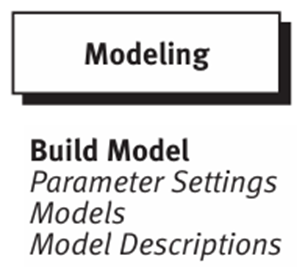

In [8]:
# I'm just giving you 1 example....
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier(max_depth=5, random_state=42)
model.fit(X_train, y_train)                                                     # train the model

,criterion,'gini'
,splitter,'best'
,max_depth,5
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,42
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


1) Choose the settings for your hyper parameters <br>
2) Build your model(s)!

# Fifth step #
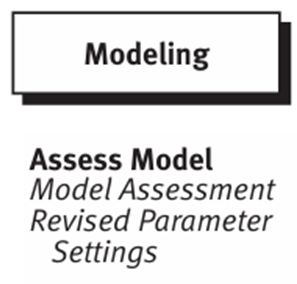

1) As you can see below a simple model already gives an accuracy of 0.981.
This result is however not so good at all! From the machine failures (28 in total) it only estimated 50% correct!!! <br>
2) What is your real goal? Have a look at https://klu.ai/glossary/accuracy-precision-recall-f1 <br>
Are you looking for precision, or recall? or something else????


accuracy is : 0.981


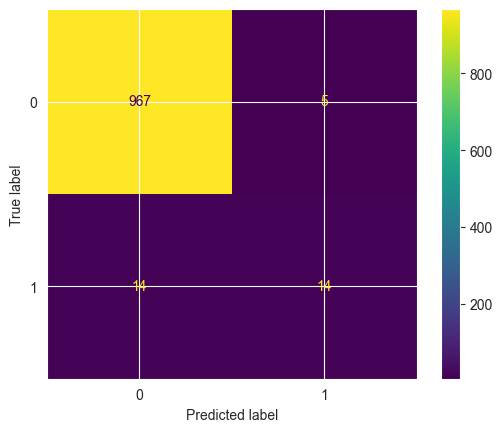

In [9]:
# I'm just giving you 1 example....
pred = model.predict(X_validation)
from sklearn.metrics import ConfusionMatrixDisplay,accuracy_score
import matplotlib.pyplot as plt
ConfusionMatrixDisplay.from_predictions(y_validation, pred)
print ('accuracy is :',accuracy_score(y_validation, pred))

# And repeat!!!! #
1) Go back to 1st, 2nd or 3rd step and improve your results!



accuracy is : 0.976


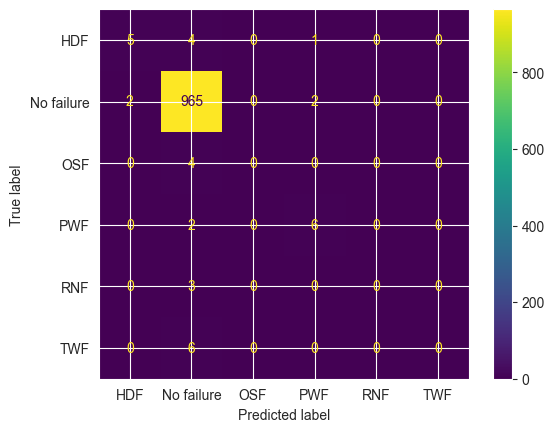

In [7]:
# trying a classfication model for selecting the type of failure
y_combined = df["Combined_failure_modes"]

from sklearn.model_selection import train_test_split
# we always want to work with a training, validation and test data set
X_train_combined, X_valid_plus_test_combined, y_train_combined, y_valid_plus_test_combined = train_test_split(X, y_combined, test_size=0.2, random_state=42)
X_test_combined, X_validation_combined, y_test_combined, y_validation_combined = train_test_split(X_valid_plus_test_combined, y_valid_plus_test_combined, test_size=0.5, random_state=42)

from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier(max_depth=5, random_state=42)
model.fit(X_train_combined, y_train_combined)

pred = model.predict(X_validation)
from sklearn.metrics import ConfusionMatrixDisplay,accuracy_score
ConfusionMatrixDisplay.from_predictions(y_validation_combined, pred)
print ('accuracy is :',accuracy_score(y_validation_combined, pred))

In [ ]:
# dont know what to do here.